Imports and useful constants

In [1]:
import geopandas
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

import sys
sys.path.append("C:\\Users\\beezy\\git\\bluebikes_system_analysis\\code")
sys.path.append("C:\\Users\\beezy\\git\\bluebikes_system_analysis\\code\\data_handling")

# for loading station information
from data_handling.data_loading_methods import *

# useful crs constants
crs_lonlat = 'EPSG:4269'
crs_cartesian_feet = 'EPSG:2263'

Function definitions

Load data

In [2]:
# load data

# census data
tractdata = load_census_tractdata()
popdata = load_census_popdata()

# city limits
citylimits = load_MA_citylimits()

# merge census and city data together
alldata = merge_geo_pop_data( tractdata, popdata, citylimits )
alldata = alldata.to_crs(crs_lonlat)

# bluebike station data
stationdata = load_station_info()
# convert to a geodataframe
station_gdf = geopandas.GeoDataFrame(
    stationdata, geometry=geopandas.points_from_xy(stationdata['lon'], stationdata['lat']), crs=crs_lonlat)

# remove stations in salem
salem_limits = citylimits.loc[ citylimits['TOWN'] == 'SALEM' ]
is_insalem = station_gdf['geometry'].map(lambda x: salem_limits['geometry'].intersects(x).any() )
station_gdf = station_gdf.loc[~is_insalem]


In [3]:
station_gdf

,eightd_has_key_dispenser,external_id,electric_bike_surcharge_waiver,name,lon,legacy_id,has_kiosk,rental_methods,capacity,station_type,eightd_station_services,lat,region_id,short_name,station_id,geometry
0,True,f83464e4-0de8-11e7-991c-3863bb43a7d0,False,Colleges of the Fenway - Fenway at Avenue Loui...,-71.100619,3,True,"[KEY, CREDITCARD]",14,classic,[],42.340115,10,B32006,3,POINT (-71.10062 42.34012)
1,False,f834658f-0de8-11e7-991c-3863bb43a7d0,False,Tremont St at E Berkeley St,-71.069616,4,True,"[KEY, CREDITCARD]",19,classic,[],42.345392,10,C32000,4,POINT (-71.06962 42.34539)
2,False,f834662c-0de8-11e7-991c-3863bb43a7d0,False,Northeastern University - North Parking Lot,-71.090179,5,True,"[KEY, CREDITCARD]",15,classic,[],42.341814,10,B32012,5,POINT (-71.09018 42.34181)
3,False,f83466c6-0de8-11e7-991c-3863bb43a7d0,False,Cambridge St at Joy St,-71.065287,6,True,"[KEY, CREDITCARD]",15,classic,[],42.361257,10,D32000,6,POINT (-71.06529 42.36126)
4,False,f8346768-0de8-11e7-991c-3863bb43a7d0,False,Fan Pier,-71.044571,7,True,"[KEY, CREDITCARD]",15,classic,[],42.353391,10,A32000,7,POINT (-71.04457 42.35339)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,False,e4678b17-face-42c3-9b5f-98418d31e3b6,False,Malden High School,-71.063937,587,True,"[KEY, CREDITCARD]",11,classic,[],42.426538,140,G32003,587,POINT (-71.06394 42.42654)
449,False,93911aa1-b5e4-48aa-a2b6-38fbcf613006,False,John Ahern Field at Kennedy-Longfellow School,-71.086310,590,True,"[KEY, CREDITCARD]",19,classic,[],42.369036,8,M32083,590,POINT (-71.08631 42.36904)
450,False,abefafdc-c772-4671-86fe-fc15a42adebb,False,87-101 Cambridgepark Drive,-71.144219,592,True,"[KEY, CREDITCARD]",23,classic,[],42.395222,NaN,M32084,592,POINT (-71.14422 42.39522)
451,False,d81e16e2-a410-4a0b-b5ae-b72748fc9781,False,Boynton Yards at 101 South Street,-71.091174,593,True,"[KEY, CREDITCARD]",19,classic,[],42.375448,NaN,S32050,593,POINT (-71.09117 42.37545)


In [4]:
# drawing the stations as circles with radius given by a walking distance

# convert station gdf CRS to cartesian
station_gdf = station_gdf.to_crs(crs=crs_cartesian_feet)

# calc distance
walktime = 5 # minutes
mph = 3.25
fph = mph * 5280 # feet per hour
fpm = fph / 60 # feet per minute
walkradius = walktime * fpm
# walkradius

# buffer
station_gdf['walkable_region'] = station_gdf.buffer(walkradius)

# station_gdf['walkable_region'].plot()
station_gdf = station_gdf.set_geometry('walkable_region')

# re-convert CRS back to lon/lat
station_gdf = station_gdf.to_crs(crs=crs_lonlat)

# station_gdf
# station_gdf.explore('capacity')

In [5]:
def partition_overlapping_regions(gdf):
    # from user sutan on gis.stackexchange
    # see https://gis.stackexchange.com/questions/387773/count-overlapping-features-using-geopandas
    
    # assuming gdf is polygon and not multipolygon
    # dissolve using unary union, then polygonize the exterior of the dissolved features
    from shapely.ops import polygonize

    # create polygon array
    exterior_geom = list(polygonize(gdf.exterior.unary_union))

    # create gdf out of the dissolved features
    gdf_exterior = geopandas.GeoDataFrame({'id':range(0, len(exterior_geom))}, geometry=exterior_geom, crs=gdf.crs).explode().reset_index(drop=True)
    gdf_exterior['id'] = gdf_exterior.index

# count the intersection of the polygonised unary_union, and the initial gdf
# the problem with intersection is that it counts if it touches
# gdf_exterior['intersection'] = [len(gdf[gdf.geometry.intersects(feature)]) for feature in gdf_exterior['geometry']]
# gdf_exterior['touching'] = [len(gdf[gdf.geometry.touches(feature)]) for feature in gdf_exterior['geometry']]

# so the real count must substract polygons that touches. it's cumbersome but, oh well.
# gdf_exterior['count'] = gdf_exterior['intersection'] - gdf_exterior['touching']
    
#     gdf_exterior = gdf_exterior.drop( columns=['intersection', 'touching'] )
    
    return gdf_exterior

station_partitions = partition_overlapping_regions(station_gdf)

C:\Users\beezy\AppData\Local\Temp\ipykernel_3640\3745754885.py:13: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  gdf_exterior = geopandas.GeoDataFrame({'id':range(0, len(exterior_geom))}, geometry=exterior_geom, crs=gdf.crs).explode().reset_index(drop=True)


In [6]:
# remove partitions that don't intersect with the original station radii

station_gdf_scaled = station_gdf.scale(xfact=1.02,yfact=1.02)
station_partitions = station_partitions.loc[ station_partitions['geometry'].map(
                        lambda x: 
                        station_gdf_scaled.contains( x ).any() ) ]

In [7]:
# compute bike capacity per partition

station_partitions['total_bike_cap'] = np.zeros( len(station_partitions.index) )

# station_partitions = station_partitions.loc[ [0,1] ]

for index, stat_part in station_partitions.iterrows():
    
    # find all stations with walk radius intersecting this partition
#     intersects_part = station_gdf.intersects( stat_part['geometry'] )
    intersects_part = station_gdf_scaled.contains( stat_part['geometry'] )
    
    # grab those stations and sum total capacity
    station_partitions.loc[ index, 'total_bike_cap' ] = np.sum( station_gdf.loc[intersects_part, 'capacity'] )
# end for

In [8]:
station_partitions

,id,geometry,total_bike_cap
0,0,"POLYGON ((-71.09533 42.33999, -71.09538 42.339...",42.0
1,1,"POLYGON ((-71.09539 42.33954, -71.09538 42.339...",28.0
2,2,"POLYGON ((-71.09539 42.33954, -71.09547 42.339...",57.0
3,3,"POLYGON ((-71.09574 42.33862, -71.09561 42.338...",43.0
4,4,"POLYGON ((-71.09574 42.33862, -71.09580 42.338...",42.0
...,...,...,...
3556,3556,"POLYGON ((-71.06856 42.42463, -71.06860 42.424...",22.0
3557,3557,"POLYGON ((-71.07281 42.42263, -71.07232 42.422...",11.0
3558,3558,"POLYGON ((-71.07281 42.42263, -71.07284 42.422...",11.0
3559,3559,"POLYGON ((-71.06856 42.42845, -71.06843 42.428...",22.0


In [9]:
supply_map = station_partitions.explore('total_bike_cap', 
                cmap = 'RdYlGn', 
                vmin = station_partitions['total_bike_cap'].min(), 
                vmax = station_partitions['total_bike_cap'].max(),
                style_kwds = { 'stroke': False } )

station_gdf = station_gdf.set_geometry('geometry')
station_gdf.explore( m = supply_map, 
                     marker_kwds = { 'radius': 2.5 },
                     style_kwds = { 'stroke': False, 'fillOpacity': 1 })

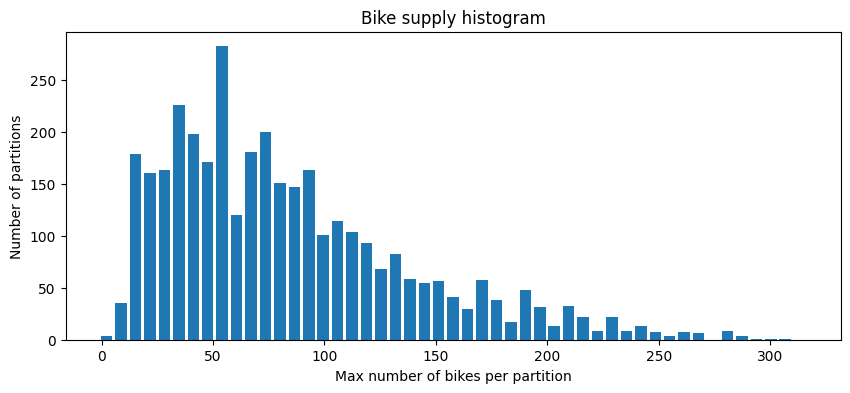

In [10]:
# histogram of bike supply by partition

# Creating histogram
nbins   = 50
fig, ax = plt.subplots(figsize =(10, 4))
ax.hist( station_partitions['total_bike_cap'], 
         bins = np.arange(station_partitions['total_bike_cap'].min()-1,
                          station_partitions['total_bike_cap'].max()+1,
                          ( station_partitions['total_bike_cap'].max() - station_partitions['total_bike_cap'].min() + 2) /nbins), 
         rwidth = 0.8 )
 
plt.xlabel("Max number of bikes per partition")
plt.ylabel("Number of partitions")
plt.title('Bike supply histogram')
    
# Show plot
plt.show()

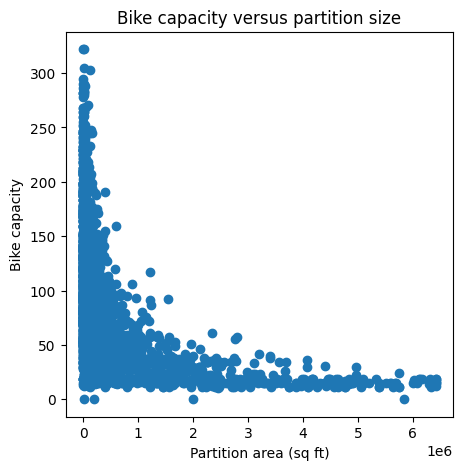

In [11]:
# plotting bike supply by partition size

# calculate area in square feet
station_partitions = station_partitions.to_crs( crs_cartesian_feet )
station_partitions['area_sqft'] =  station_partitions['geometry'].area
station_partitions = station_partitions.to_crs( crs_lonlat )

# plot bike supply vs partition size
fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( x = station_partitions['area_sqft'], 
            y = station_partitions['total_bike_cap'])
 
plt.xlabel("Partition area (sq ft)")
plt.ylabel("Bike capacity")
plt.title('Bike capacity versus partition size')
# plt.xlim( (-0.001, 0.05 ) )
    
# Show plot
plt.show()

In [12]:
# calculate the weighted average of population density in each partition

station_partitions['popdense'] = np.zeros( len(station_partitions.index) )

# print(station_partitions.head())

for index, part in station_partitions.iterrows():
    
    # find and get the intersecting shapes
    intersecting_tracts = alldata.loc[ alldata.intersects( part['geometry'] ) ]
    intersecting_shapes = intersecting_tracts.intersection( part['geometry'] )

    # get the area of the intersecting shapes
    intersecting_shape_areas = intersecting_shapes.to_crs(crs_cartesian_feet).area

    # calculate weighted average of population density
    station_partitions.loc[index, 'popdense'] = intersecting_shape_areas.multiply( intersecting_tracts['popdense_totalarea'] ).sum()/part['area_sqft']


In [13]:
popdense_map = station_partitions.explore('popdense', 
                cmap = 'RdYlGn', 
                vmin = station_partitions['popdense'].min(), 
                vmax = station_partitions['popdense'].max(),
                style_kwds = { 'stroke': False } )

station_gdf = station_gdf.set_geometry('geometry')
station_gdf.explore( m = popdense_map, 
                     marker_kwds = { 'radius': 2.5 },
                     style_kwds = { 'stroke': False, 'fillOpacity': 1 })

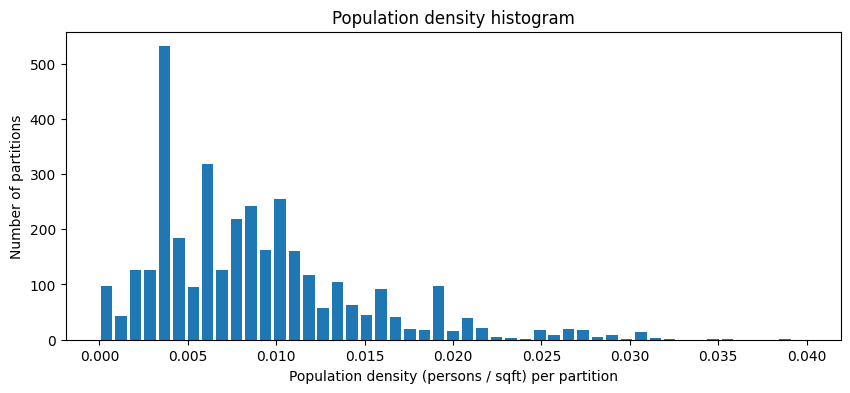

In [14]:
# histogram of pop density by partition

# Creating histogram
nbins   = 50
fig, ax = plt.subplots(figsize =(10, 4))
ax.hist( station_partitions['popdense'], 
         bins = np.arange(station_partitions['popdense'].min(),
                          station_partitions['popdense'].max(),
                          ( station_partitions['popdense'].max() - station_partitions['popdense'].min() ) /nbins), 
         rwidth = 0.8 )
 
plt.xlabel("Population density (persons / sqft) per partition")
plt.ylabel("Number of partitions")
plt.title('Population density histogram')
    
# Show plot
plt.show()

In [15]:
# Calculate and plot supply/demand
# as bike supply/population density
station_partitions['supply_to_popdense'] = station_partitions['total_bike_cap']/station_partitions['popdense']
station_partitions.loc[ np.isinf(station_partitions['supply_to_popdense']), 'supply_to_popdense'] = np.nan # set infinite values to nan for plotting purposes

# log scale for plotting and visualizing
station_partitions['log10_supply_to_popdense'] = np.log10( station_partitions['supply_to_popdense'] )
station_partitions.loc[ np.isinf(station_partitions['log10_supply_to_popdense']), 'log10_supply_to_popdense'] = np.nan # set infinite values to nan for plotting purposes

# sum(np.isinf(station_partitions['supply_to_popdense']))

c:\python\py3_11\virtual_envs\geopandas\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


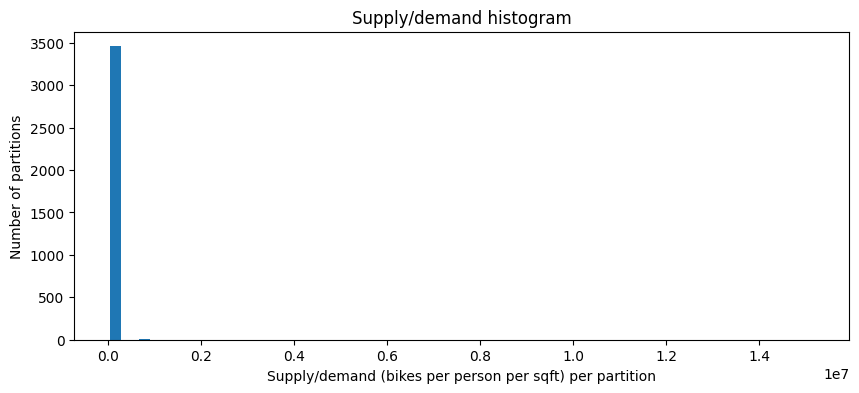

In [16]:
# plotting a histogram of supply/demand, in linear scale

# Creating histogram
nbins   = 50
fig, ax = plt.subplots(figsize =(10, 4))
ax.hist( station_partitions['supply_to_popdense'], 
         bins = np.arange(station_partitions['supply_to_popdense'].min(),
                          station_partitions['supply_to_popdense'].max(),
                          ( station_partitions['supply_to_popdense'].max() - station_partitions['supply_to_popdense'].min() ) /nbins), 
         rwidth = 0.8 )
 
plt.xlabel("Supply/demand (bikes per person per sqft) per partition")
plt.ylabel("Number of partitions")
plt.title('Supply/demand histogram')
    
# Show plot
plt.show()

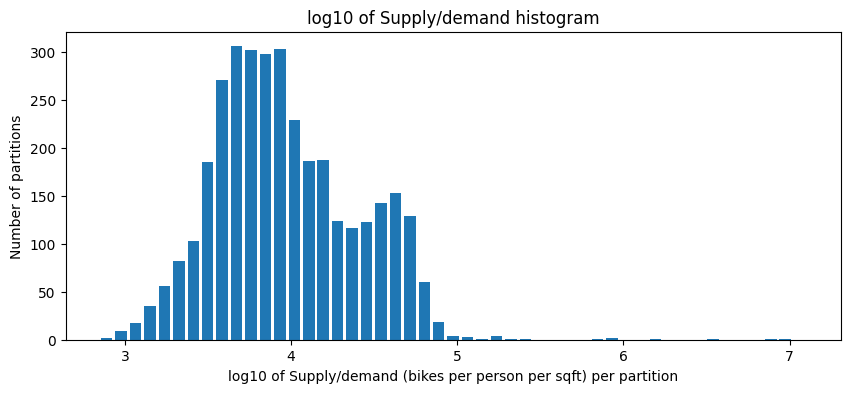

In [17]:
# plotting a histogram of supply/demand, in log scale

# Creating histogram
nbins   = 50
fig, ax = plt.subplots(figsize =(10, 4))
ax.hist( station_partitions['log10_supply_to_popdense'], 
         bins = np.arange(station_partitions['log10_supply_to_popdense'].min(),
                          station_partitions['log10_supply_to_popdense'].max(),
                          ( station_partitions['log10_supply_to_popdense'].max() - station_partitions['log10_supply_to_popdense'].min() ) /nbins), 
         rwidth = 0.8 )
 
plt.xlabel("log10 of Supply/demand (bikes per person per sqft) per partition")
plt.ylabel("Number of partitions")
plt.title('log10 of Supply/demand histogram')
    
# Show plot
plt.show()

In [18]:
station_partitions['log10_supply_to_popdense'].min()

2.8464288826053346

In [19]:
# plot supply/demand (log10) on map

upperthresh = 5
supdemand_map = station_partitions.explore('log10_supply_to_popdense', 
#                 cmap = 'RdYlGn', 
#                 cmap = 'inferno',
#                 cmap = 'coolwarm',
                cmap = 'RdBu',
                vmin = station_partitions['log10_supply_to_popdense'].min(), 
                vmax = upperthresh,
                style_kwds = { 'stroke': False, 'fillOpacity':0.7 } )

station_gdf = station_gdf.set_geometry('geometry')
station_gdf.explore( m = supdemand_map, 
                     marker_kwds = { 'radius': 2.5 },
                     style_kwds = { 'stroke': False, 'fillOpacity': 0.7, 'fillColor': 'black' })

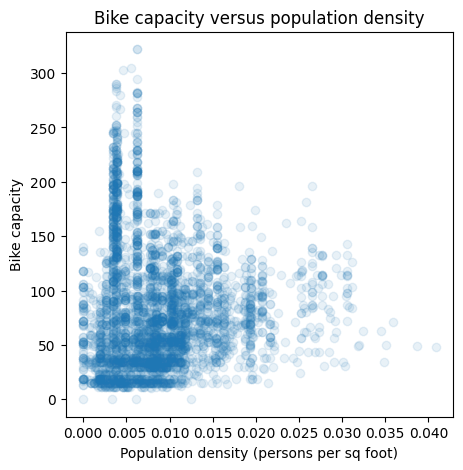

In [23]:
# plotting supply vs. demand on a scatter plot

fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( 
    x = station_partitions['popdense'], 
    y = station_partitions['total_bike_cap'],
    alpha = 0.1
)
 
plt.xlabel("Population density (persons per sq foot)")
plt.ylabel("Bike capacity")
plt.title('Bike capacity versus population density')
# plt.xlim( (-0.001, 0.05 ) )
    
# Show plot
plt.show()

Now revisiting supply/demand but by zone type

In [24]:
# only keep partitions in boston city limits

# city limits
citylimits = load_MA_citylimits()

# filter for partitions in boston
bos_limits = citylimits.loc[ citylimits['TOWN'] == 'BOSTON' ]
is_inbos = station_partitions['geometry'].map(lambda x: bos_limits['geometry'].contains(x).any() )
station_partitions_inbos = station_partitions.loc[is_inbos]

In [25]:
station_partitions_inbos.explore()

In [26]:
# loading zoning subdistrict data
zoningdata = load_boston_zoning_data()

# combine all zones of each type into one big shape each
zones_shapecombined = {}
# get zone types
zonetypes = zoningdata['Zone type'].unique()

for zonetype in zonetypes:
    zones_shapecombined[zonetype] = zoningdata.loc[zoningdata['Zone type'] == zonetype].dissolve()

In [33]:
# Find what zones each station partition intersects, filter capacity metric by zone type
# TODO

# station_partitions_inbos['Zone type'] = np.repeat( '', len(station_partitions_inbos.index) )
# station_partitions_inbos['Zone type'] = np.empty((len(station_partitions_inbos),0)).tolist() # fill column with empty lists

zones_intersecting_partition = []

for index, part in station_partitions_inbos.iterrows():
    
    # find all zones intersecting this partition
    intersects_part = zoningdata.intersects( part['geometry'] )
    zones_intersecting_partition.append(zoningdata.loc[ intersects_part, 'Zone type' ].values)
    # # get zone type
    # station_partitions_inbos.loc[index, 'Zone type'] = zoningdata.loc[ intersects_part, 'Zone type' ].values

station_partitions_inbos['Zone type'] = zones_intersecting_partition

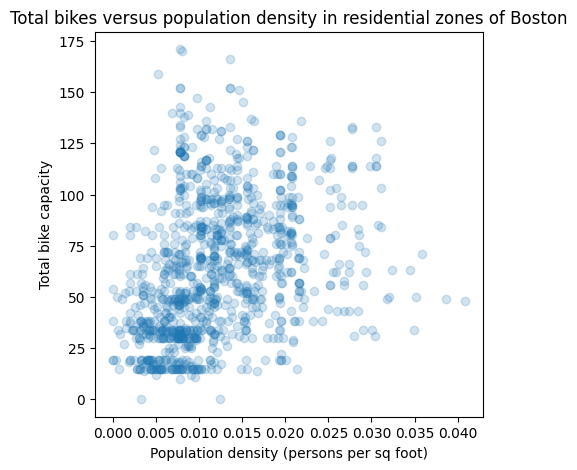

In [39]:
# plotting supply to demand for all partitions intersecting residential zones
station_parts_residential = station_partitions_inbos.loc[ [ 'Residential' in zts for zts in station_partitions_inbos['Zone type'] ] ]

fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( 
    x = station_parts_residential['popdense'] * 100, 
    y = station_parts_residential['total_bike_cap'],
    alpha = 0.2, 
)
 
plt.xlabel("Population density (persons per 100 sq feet)")
plt.ylabel("Total bike capacity")
plt.title('Total bikes versus population density in residential zones of Boston')
    
# Show plot
plt.show()

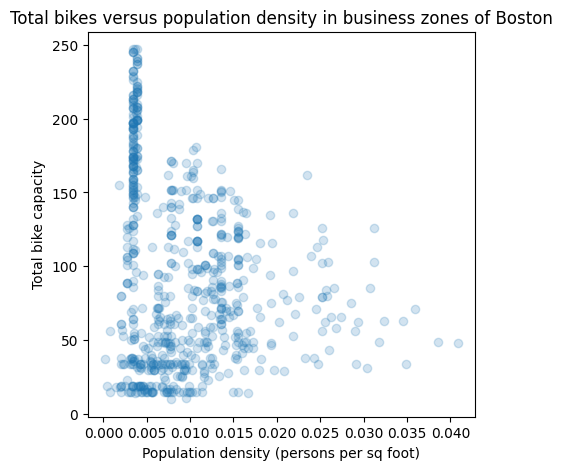

In [40]:
# plotting supply to demand for all business zoned partitions
station_parts_business = station_partitions_inbos.loc[ [ 'Business' in zts for zts in station_partitions_inbos['Zone type'] ] ]

fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( 
    x = station_parts_business['popdense'] * 100, 
    y = station_parts_business['total_bike_cap'],
    alpha = 0.2,
)
 
plt.xlabel("Population density (persons per 100 sq feet)")
plt.ylabel("Total bike capacity")
plt.title('Total bikes versus population density in business zones of Boston')
    
# Show plot
plt.show()

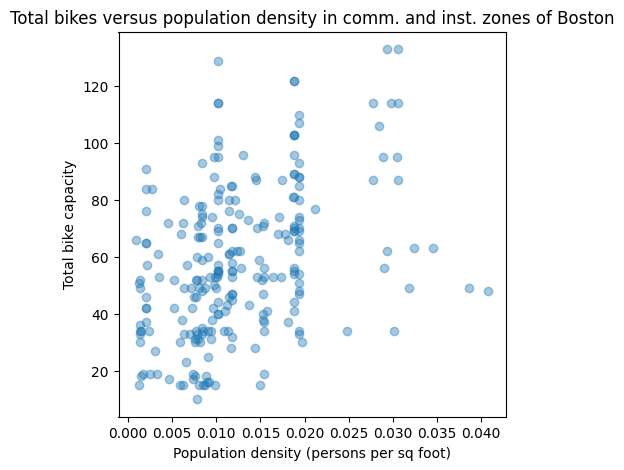

In [42]:
# plotting supply to demand for all commercial and institutional zoned partitions
station_parts_comm = station_partitions_inbos.loc[ [ 'Comm/Instit' in zts for zts in station_partitions_inbos['Zone type'] ] ]

fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( 
    x = station_parts_comm['popdense'] * 100, 
    y = station_parts_comm['total_bike_cap'],
    alpha = 0.4,    
)
 
plt.xlabel("Population density (persons per 100 sq feet)")
plt.ylabel("Total bike capacity")
plt.title('Total bikes versus population density in comm. and inst. zones of Boston')
    
# Show plot
plt.show()

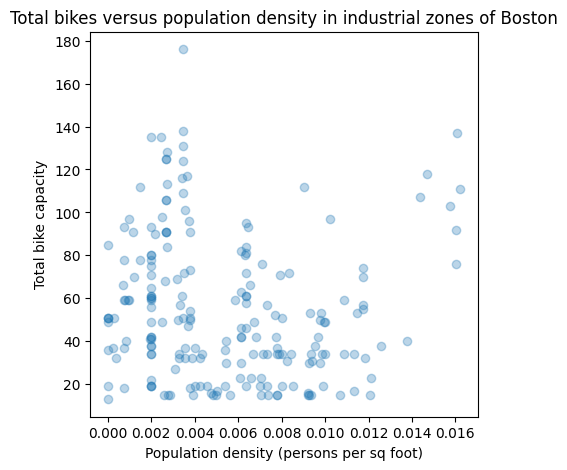

In [44]:
# plotting supply to demand for all industrially zoned partitions
station_parts_indust = station_partitions_inbos.loc[ [ 'Industrial' in zts for zts in station_partitions_inbos['Zone type'] ] ]

fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( 
    x = station_parts_indust['popdense'] * 100, 
    y = station_parts_indust['total_bike_cap'],
    alpha = 0.3,
)
 
plt.xlabel("Population density (persons per 100 sq feet)")
plt.ylabel("Total bike capacity")
plt.title('Total bikes versus population density in industrial zones of Boston')
    
# Show plot
plt.show()

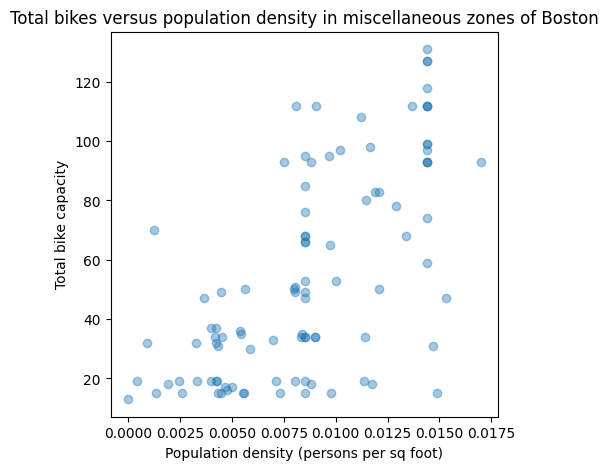

In [46]:
# plotting supply to demand for all miscellaneous zoned partitions
station_parts_misc = station_partitions_inbos.loc[ [ 'Miscellaneous' in zts for zts in station_partitions_inbos['Zone type'] ] ]

fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( 
    x = station_parts_misc['popdense'] * 100, 
    y = station_parts_misc['total_bike_cap'],
    alpha = 0.4,
)
 
plt.xlabel("Population density (persons per 100 sq feet)")
plt.ylabel("Total bike capacity")
plt.title('Total bikes versus population density in miscellaneous zones of Boston')
    
# Show plot
plt.show()

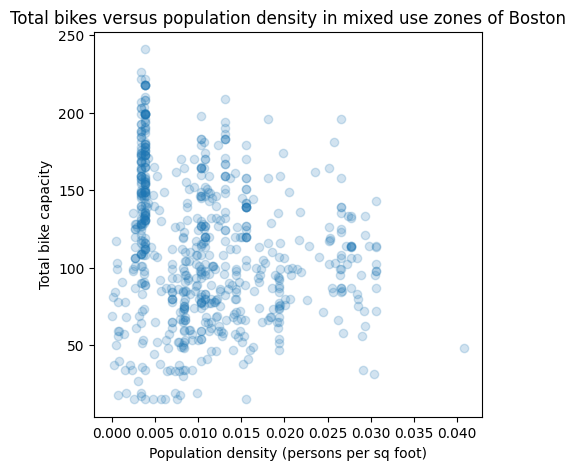

In [47]:
# plotting supply to demand for all mixed use zoned partitions
station_parts_mix = station_partitions_inbos.loc[ [ 'Mixed Use' in zts for zts in station_partitions_inbos['Zone type'] ] ]

fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( 
    x = station_parts_mix['popdense'] * 100, 
    y = station_parts_mix['total_bike_cap'],
    alpha = 0.2,    
)
 
plt.xlabel("Population density (persons per 100 sq feet)")
plt.ylabel("Total bike capacity")
plt.title('Total bikes versus population density in mixed use zones of Boston')
    
# Show plot
plt.show()

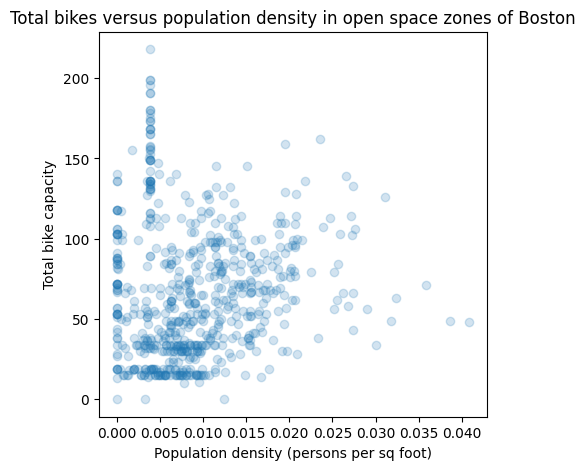

In [49]:
# plotting supply to demand for all open space use zoned partitions
station_parts_open = station_partitions_inbos.loc[ [ 'Open Space' in zts for zts in station_partitions_inbos['Zone type'] ]]

fig, ax = plt.subplots(figsize =(5,5))
ax.scatter( 
    x = station_parts_open['popdense'] * 100, 
    y = station_parts_open['total_bike_cap'],
    alpha = 0.2,    
)
 
plt.xlabel("Population density (persons per 100 sq feet)")
plt.ylabel("Total bike capacity")
plt.title('Total bikes versus population density in open space zones of Boston')
    
# Show plot
plt.show()